# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Loan Approval Prediction: Data Exploration, Preprocessing, Modeling and Evaluation</p>


## Project: Loan Approval Prediction

The goal of this project is to develop and evaluate various machine learning models to predict the loan status of people based on their financial records and key information related to loan applications. By analyzing and comparing different models, the aim is to identify the most effective model for predicting whether a loan will be approved or not.
#
## Steps Involved

### 1. Data Exploration
- **Load the Dataset**: Import the dataset using Pandas from a CSV file.
- **Initial Inspection**: Display the first few rows, last few rows, and a random sample of the data to understand its structure.
- **Data Overview**: Check the shape of the dataset and review the column names and data types.
- **Missing Values and Duplicates**: Identify any missing values and duplicate records in the dataset and handle them accordingly.
- **Descriptive Statistics**: Generate summary statistics for numerical and categorical features to understand data distributions and uni

### 2. Data Cleaning
- **Handling Missing Values**: Handle the missing values in the dataset.
- **Handling Outliers**: Check the outliers in the dataset using IQR or Z-score then use necessary technique to clean them.
- **Handling Duplicated**: Removing duplicates from the dataset.
- **Ready for EDA Step**: Ensuring the dataset is in best condition for EDA. 

### 3. EDAVisualization
- **Numerical Features**: Create histograms to visualize the distribution of numerical features.
- **Correlation Heatmap**: Generate a heatmap to visualize the correlation between numerical features.
- **Loan Status Distribution**: Use countplots to visualize the distribution of loan status.
- **Categorical Features**: Visualize the relationship between categorical features and loan status using countplots.
- **Pairplot**: Create pairplots to visualize relationships between numerical features and 4oan status.

### 4. Data Preprocessing
- **Encoding Categorical Variables**: Convert categorical features into numeric using `One Hot Encoder`.
- **Scaling Numerical Features**: Standardize numerical features using `StandardScaler` to ensure they are on same scale.

### 5. Model Building and Evaluation
- **Splitting the Dataset**: Divide the dataset into training and testing sets.
- **Model Selection**: Choose a variety of machine learning models, including:
  - Random Forest
  - Gradient Boosting
  - Logistic Regression
  - Support Vector Classifier (SVC)
  - Decision Tree
  - Bagging Classifier
  - LightGBM
- **Model Training and Prediction**: Train each model on the training data and make predictions on the testing data.
- **Evaluation Metrics**: Calculate and compare performance metrics for each model, including accuracy, pre6ision, recall, and F1 score.

### 6. Model Comparison and Visualization
- **Metric Comparison**: Compare the performance of each model using the calculated metrics.
- **Visualization**: Create bar plots to visualize the performance metrics for each model.
- **Best Model Selection**: Identify the best-performing model based on metrics such as accuracy7 precision, recall, and F1 score.

### 7. Final Analysis
- **Best Model for Imbalanced Data**: Discuss the model that performs best based on the F1 score, which is a good metric for imbalanced datasets.
- **Model Training on Full Dataset**: Optionally, train the best-performing model on te full dataset to optimize its performance.


# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">About the Dataset</p>

## Dataset Description: Loan Approval Dataset

The Loan Approval dataset comprises financial records and key information related to loan applications, aiming to predict loan approval decisions made by lending institutions. Each record in the dataset contains various features that reflect the applicant's financial and personal profile. These features include:

- **CIBIL Score**: A credit score that assesses the creditworthiness of the applicant.
- **Income**: The applicant’s total income, typically used to gauge their ability to repay the loan.
- **Employment Status**: Indicates whether the applicant is employed, self-employed, or unemployed.
- **Loan Term**: The duration for which the loan is taken.
- **Loan Amount**: The total amount of loan applied for.
- **Assets Value**: Represents the value of the applicant's assets, which may be considered as collateral.
- **Loan Status**: The target variable indicating whether the loan was approved or denied.

This dataset is frequently used in machine learning to build predictive models that help financial institutions assess the risk of approving loans. By analyzing the relationship between these features and the loan status, models can be trained to forecast the likelihood of approval, supporting more data-driven lendin decisions.


# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Data Exploration</p>

## Library And Imports 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
df = pd.read_csv('/kaggle/input/loan-approval-prediction-dataset/loan_approval_dataset.csv')

In [3]:
df.shape

(4269, 13)

In [4]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [5]:
df.columns

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

In [6]:
df.dtypes

loan_id                       int64
 no_of_dependents             int64
 education                   object
 self_employed               object
 income_annum                 int64
 loan_amount                  int64
 loan_term                    int64
 cibil_score                  int64
 residential_assets_value     int64
 commercial_assets_value      int64
 luxury_assets_value          int64
 bank_asset_value             int64
 loan_status                 object
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [8]:
df.describe()

,loan_id,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03
mean,2135.000000,2.498712,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06
std,1232.498479,1.695910,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06
min,1.000000,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00
25%,1068.000000,1.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06
50%,2135.000000,3.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06
75%,3202.000000,4.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06
max,4269.000000,5.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07


In [9]:
df.isnull().sum()

loan_id                      0
 no_of_dependents            0
 education                   0
 self_employed               0
 income_annum                0
 loan_amount                 0
 loan_term                   0
 cibil_score                 0
 residential_assets_value    0
 commercial_assets_value     0
 luxury_assets_value         0
 bank_asset_value            0
 loan_status                 0
dtype: int64

In [10]:
df.duplicated().sum()

0

## Summary of Data Exploration

#### Data Overview
- **Shape of DataFrame:** The dataset contains **4,269 rows** and **13 columns**.
- **Column Types:** The columns consist of **10 numeric (int64)** and **3 categorical (object)** data types.

#### Column Details

**Numerical Columns:**
- **loan_id:** Unique identifier for each loan.
- **no_of_dependents:** Number of dependents of the loan applicant.
- **income_annum:** Annual income of the applicant (in currency).
- **loan_amount:** Total amount of the loan requested.
- **loan_term:** Duration of the loan (in months).
- **cibil_score:** Credit score of the applicant.
- **residential_assets_value, commercial_assets_value, luxury_assets_value, bank_asset_value:** Values of various assets owned by the applicant.

**Categorical Columns:**
- **education:** Educational qualification of the applicant (Graduate or Not Graduate).
- **self_employed:** Employment status of the applicant (Yes or No).
- **loan_status:** Target variable indicating whether the loan was Approved or Rejected.

#### Missing Values
- There are **no missing values** in any of the columns, ensuring that all data is complete for analysis.

#### Summary Statistics
- **Numerical columns** show a range of values, with insights such as:
  - The mean of `income_annum` is approximately **5.06 million**, and the maximum is around **9.9 million**.
  - The `cibil_score` ranges from **300 to 900**, with a mean of about **600**.
  - The `loan_amount` has a significant range, with the minimum being **300,000** and the maximum reaching almost **40 million**.

#### Distribution of the Target Variable (`loan_status`)
- An analysis of the `loan_status` will help identify if the dataset is **balanced or imbalanced**, which is crucial for model training and evaluation.

model training and evaluation.

#### Column Name Issues
- Identified **leading spaces** in column names (e.g., `' no_of_dependents'`), which will need to be addressed in the data cleaning step to avoid errors during analysis and model training

## Key Actions Moving Forward

To move forward effectively, the first step is to address the leading spaces in the column names to ensure clean access to the data. Next, it’s essential to perform a deeper analysis on the distribution of the target variable, which will help determine if any class balancing techniques are necessary. Finally, preparations should be made for the subsequent steps, which include data cleaning, exploratory data analysis (EDA), handling outliers, preprocessing the data, and modeling. By following these actions, we will set a solid foundation for the next phases of the machine learning project.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Data Cleaning</p>

In [11]:
print(df.columns)

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')


In [12]:
# Dropping the id column
df.drop(columns=['loan_id'], inplace=True)

## Adjusting Leading Spaces

In [13]:
# Remove leading spaces from column names
df.rename(columns=lambda x: x.strip(), inplace=True)

# Display the updated DataFrame
print(df.columns)

Index(['no_of_dependents', 'education', 'self_employed', 'income_annum',
       'loan_amount', 'loan_term', 'cibil_score', 'residential_assets_value',
       'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value',
       'loan_status'],
      dtype='object')


## Outlier Detection and Removal

In [14]:
numeric_columns = [
    'income_annum', 'loan_amount', 'loan_term', 
    'cibil_score', 'residential_assets_value', 
    'commercial_assets_value', 'luxury_assets_value', 
    'bank_asset_value'
]

In [15]:
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

outliers_iqr = {col: detect_outliers_iqr(df, col) for col in numeric_columns}
print("Outlier: ", len(outliers_iqr))

Outlier:  8


In [16]:
sns.set(style="whitegrid")
custom_palette = sns.color_palette(["#81c784", "#388e3c", "#74c69d"])

Boxplot was utilized to visualize the potential outliers in the dataset

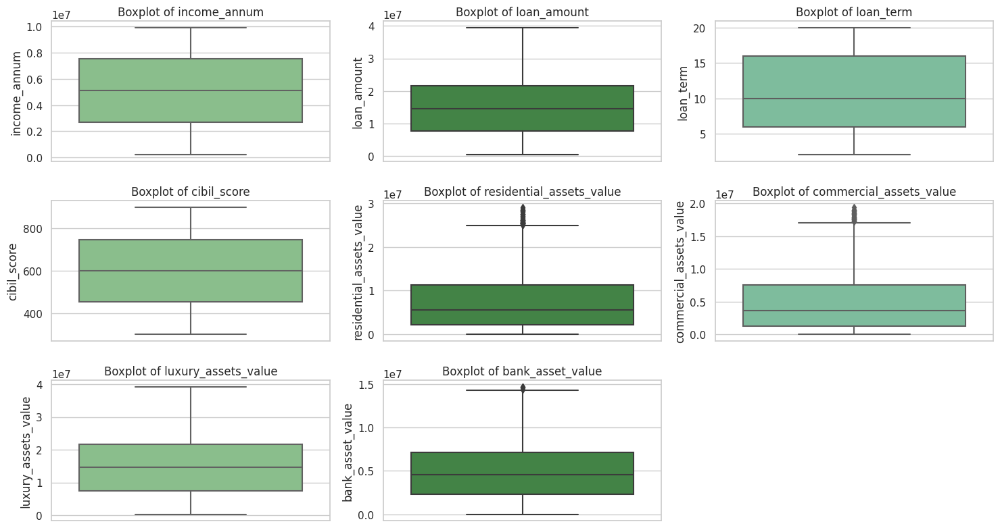

In [17]:
def plot_boxplots(df, columns):
    plt.figure(figsize=(15, 8))
    for i, col in enumerate(columns):
        plt.subplot(3, 3, i + 1)
        sns.boxplot(y=df[col], color=custom_palette[i % 3])
        plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()

plot_boxplots(df, numeric_columns)

Using Z-score for outlier detection

In [18]:
def detect_outliers_zscore(df, columns, threshold=3):
    outlier_indices = []
    for col in columns:
        z_scores = np.abs(stats.zscore(df[col]))
        outlier_indices.extend(np.where(z_scores > threshold)[0])
    return set(outlier_indices)

outliers_zscore = detect_outliers_zscore(df, numeric_columns)
print(f'Number of outliers detected using Z-scores: {len(outliers_zscore)}')

Number of outliers detected using Z-scores: 33


Dropping the outliers 

In [19]:
df.shape

(4269, 12)

In [20]:
# df_cleaned = df.drop(index=outliers_zscore).reset_index(drop=True)

df_cleaned = df.drop(index=outliers_zscore)
print(f'Shape of DataFrame after outlier removal: {df_cleaned.shape}')

Shape of DataFrame after outlier removal: (4236, 12)


In [21]:
df_cleaned.shape

(4236, 12)

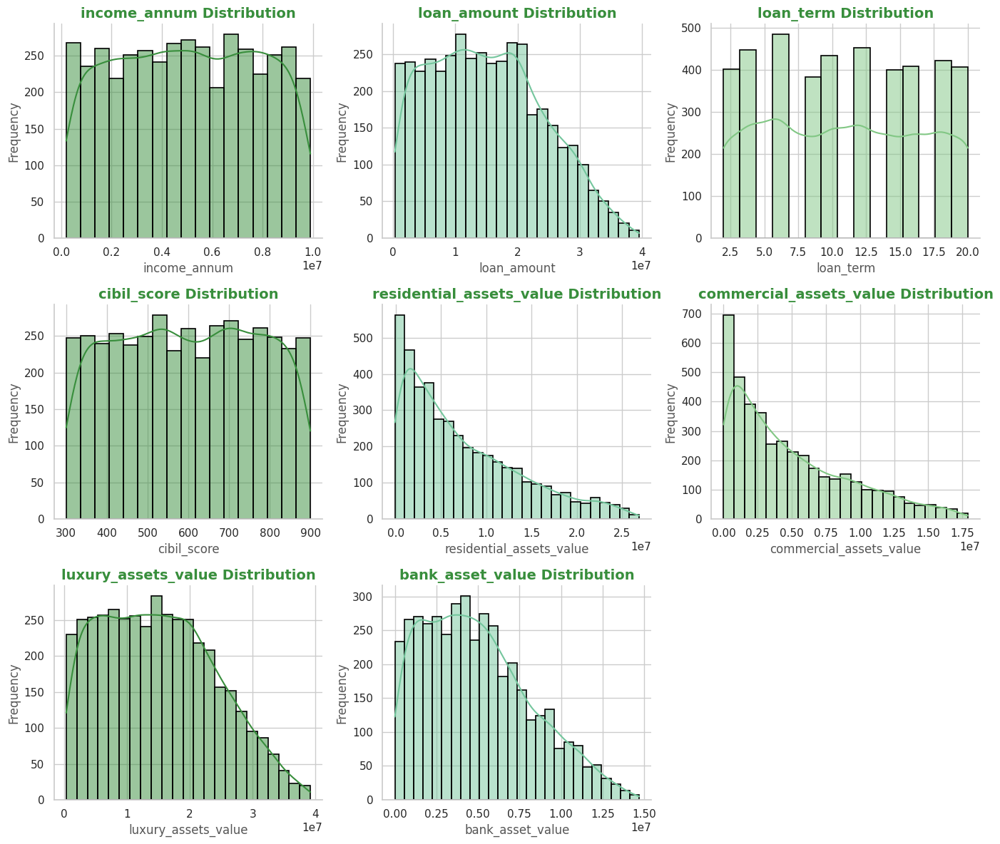

In [22]:
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(14, 12))

for idx, col in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns)//3 + 1, 3, idx)  
    sns.histplot(df_cleaned[col], kde=True, color=custom_palette[idx % 3], edgecolor="black", linewidth=1.2) 
    
    plt.title(f'{col} Distribution', fontsize=14, weight='bold', color="#388e3c")
    plt.xlabel(col, fontsize=12, color="#555555")
    plt.ylabel('Frequency', fontsize=12, color="#555555")
    
    sns.despine()

plt.tight_layout()
plt.show()

## Summary of Data Cleaning Step

The data cleaning process began with the removal of the id column, as it was deemed unnecessary for analysis. Next, identified and addressed some unusual leading spaces in the column names to ensure consistency and accuracy.

To detect outliers, both the Interquartile Range (IQR) and Z-score methods were employed. As a result, outliers in several columns were identified and subsequently removed from the dataset to enhance the integrity of the analysis.

Finally, observed skewness in certain columns, which will be addressed in the preprocessing step to ensure a more balanced dataset for further analysis.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Exploratory Data Analysis</p>

For the project, a detailed Exploratory Data Analysis (EDA) is essential to gain insights into the dataset and understand the relationships between features and the target variable (loan_status). Below is a comprehensive EDA plan and Python code to implement it:

### 1. Univariate Analysis

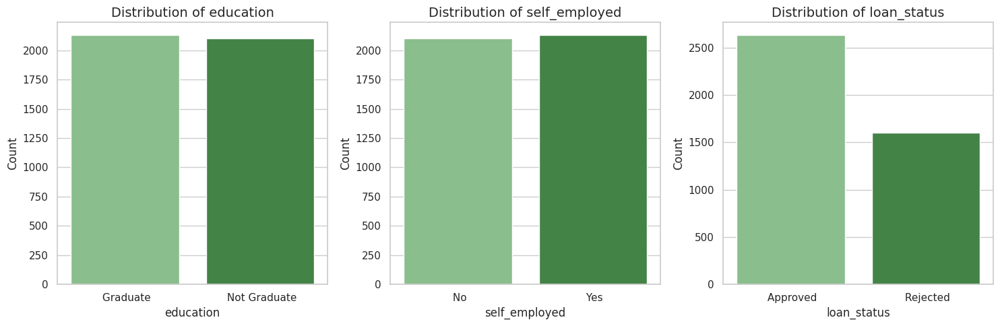

In [23]:
categorical_columns = ['education', 'self_employed', 'loan_status']

plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(1, 3, i)
    sns.countplot(x=df_cleaned[column], palette=custom_palette)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

### 2. Bivariate Analysis

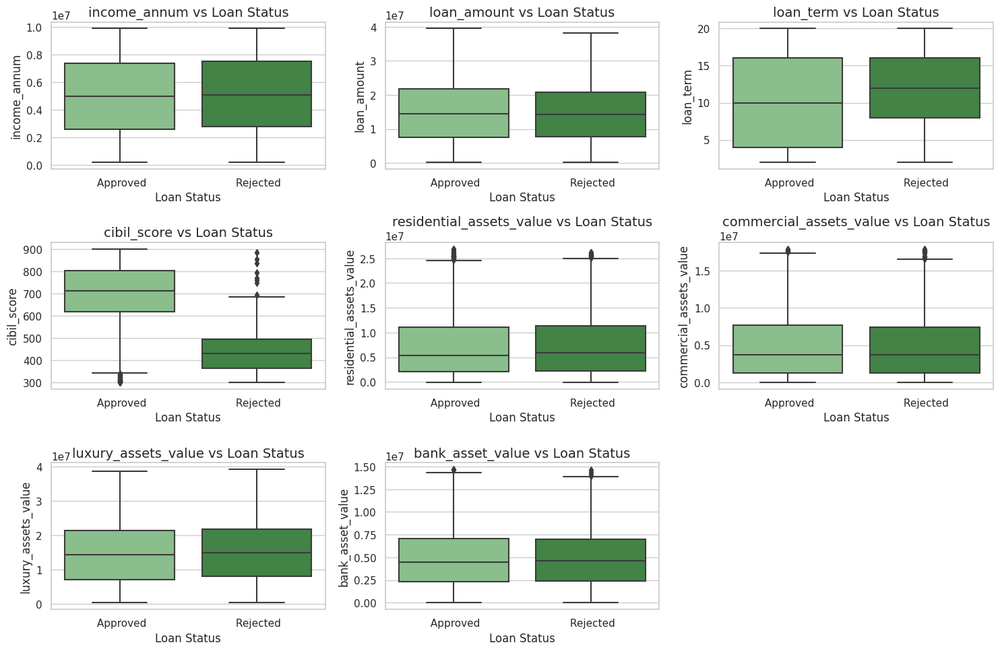

In [24]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='loan_status', y=column, data=df_cleaned, palette=custom_palette)
    plt.title(f'{column} vs Loan Status', fontsize=14)
    plt.xlabel('Loan Status')
    plt.ylabel(column)
plt.tight_layout()
plt.show()

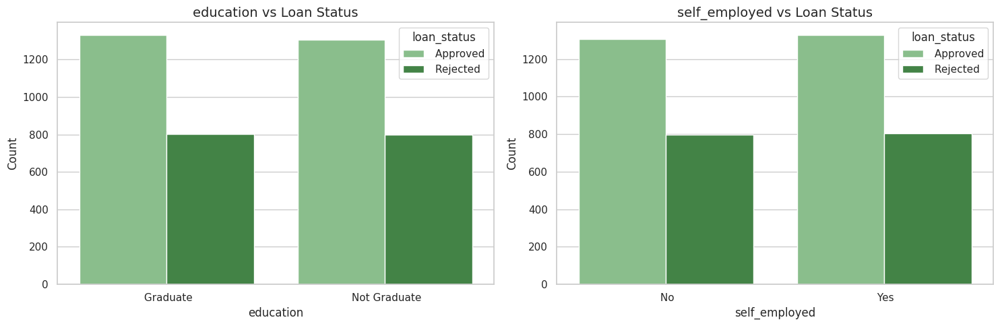

In [25]:
plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns[:-1], 1):
    plt.subplot(1, 2, i)
    sns.countplot(x=column, hue='loan_status', data=df_cleaned, palette=custom_palette)
    plt.title(f'{column} vs Loan Status', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

### 3. Correlation Analysis

To explore relationships between numeric features, we can use a correlation matrix and heatmap.

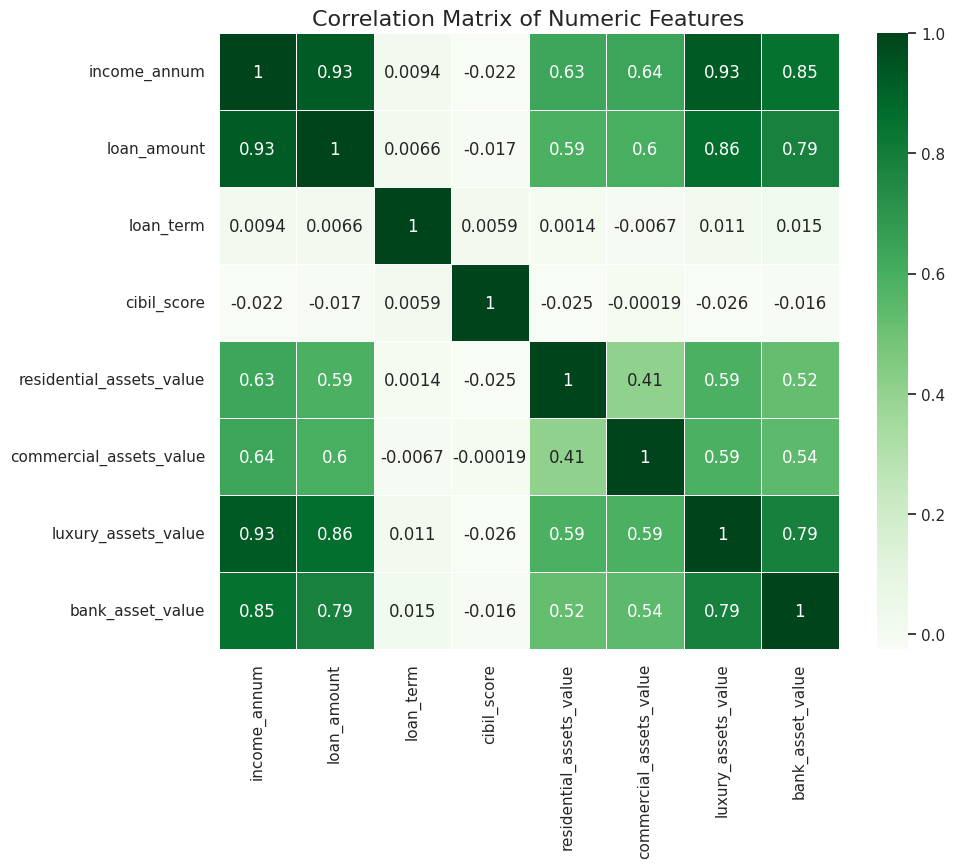

In [26]:
correlation_matrix = df_cleaned[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', linewidths=0.5) 
plt.title('Correlation Matrix of Numeric Features', fontsize=16)
plt.show()

### 4. Understanding Feature Combinations

We’ll explore if higher income or a higher credit score increases loan approval chances.

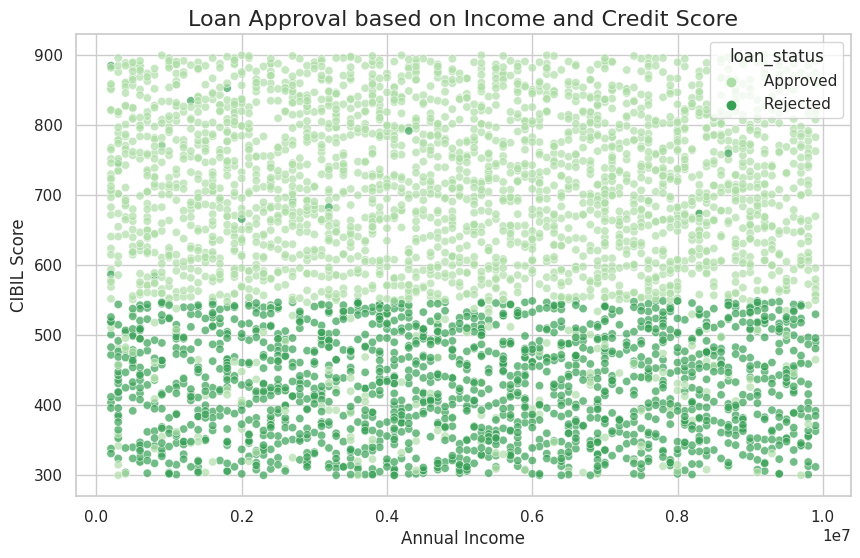

In [27]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='income_annum', y='cibil_score', hue='loan_status', data=df_cleaned, palette="Greens", alpha=0.7)
plt.title('Loan Approval based on Income and Credit Score', fontsize=16)
plt.xlabel('Annual Income')
plt.ylabel('CIBIL Score')
plt.show()

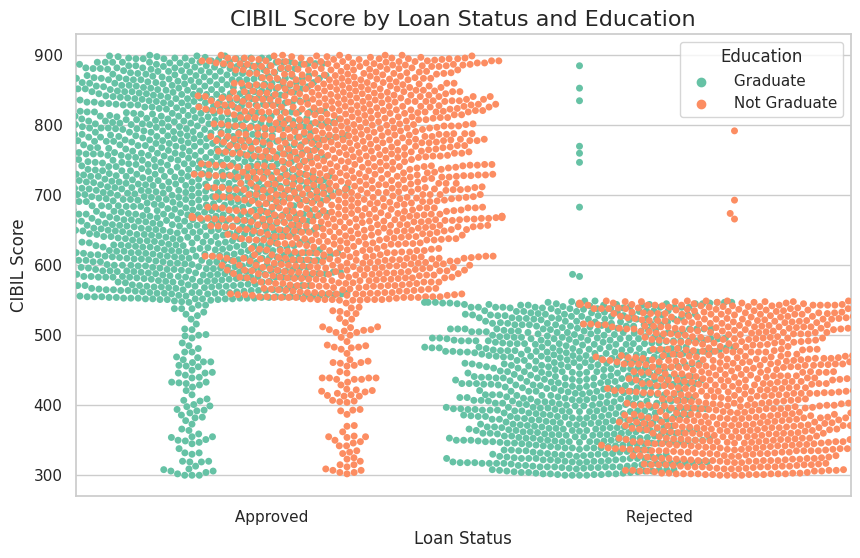

In [28]:
plt.figure(figsize=(10, 6))
sns.swarmplot(x='loan_status', y='cibil_score', data=df_cleaned, hue='education', palette='Set2', dodge=True)
plt.title('CIBIL Score by Loan Status and Education', fontsize=16)
plt.xlabel('Loan Status')
plt.ylabel('CIBIL Score')
plt.legend(title='Education')
plt.show()

### 5. Multivariate Analysis: Interaction Between Features

A pairplot is useful for visualizing the relationships between different numeric features, especially when colored by the target variable.

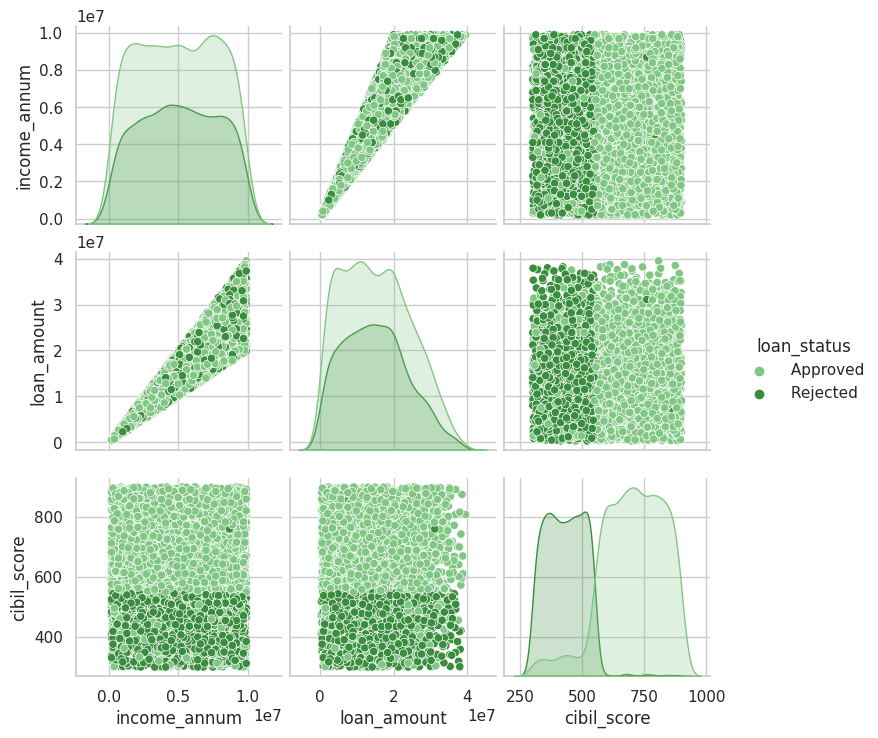

In [29]:
selected_columns = ['income_annum', 'loan_amount', 'cibil_score', 'loan_status']
sns.pairplot(df_cleaned[selected_columns], hue='loan_status', palette=custom_palette, diag_kind='kde')
plt.show()

No data for 'Approved' loan status


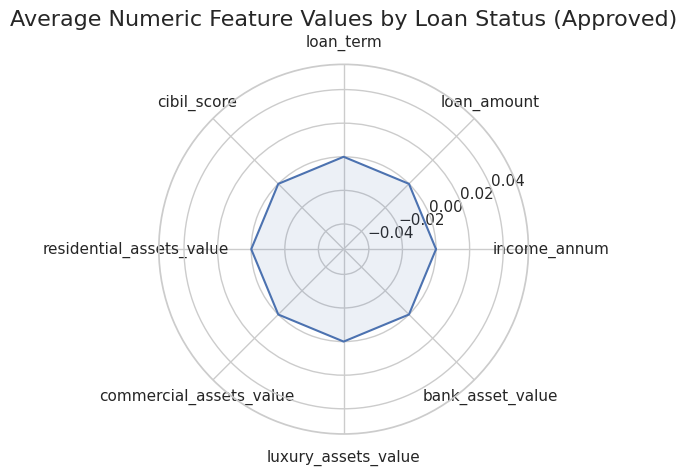

In [30]:
from math import pi

numeric_columns = df_cleaned[numeric_columns].select_dtypes(include=['number']).columns.tolist()

categories = list(numeric_columns)
group_means = df_cleaned.groupby('loan_status')[numeric_columns].mean()

if 'Approved' in group_means.index:
    values = group_means.loc['Approved'].values.flatten().tolist()
else:
    print("No data for 'Approved' loan status")
    values = [0] * len(categories)  

values += values[:1] 
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1] 

if len(angles) != len(values):
    print(f"Warning: angles ({len(angles)}) and values ({len(values)}) lengths do not match.")
    if len(values) < len(angles):
        values = values + [values[0]]  
    elif len(angles) < len(values):
        angles = angles + [angles[0]]

# Plot
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories)
ax.plot(angles, values, color='b') 
ax.fill(angles, values, 'b', alpha=0.1)
plt.title('Average Numeric Feature Values by Loan Status (Approved)', fontsize=16)
plt.show()


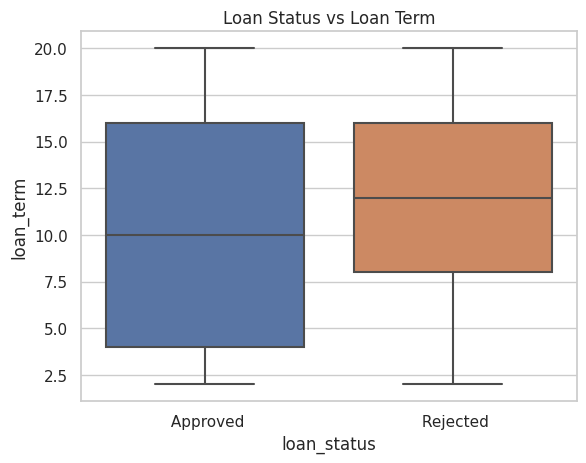

In [31]:
sns.boxplot(x="loan_status", y="loan_term", data=df_cleaned)
plt.title('Loan Status vs Loan Term')
plt.show()

## Summary of EDA 

This EDA process gives a deep understanding of the features and their relationships to the target (loan_status). The insights gained from this analysis can inform the data preprocessing steps (e.g., handling outliers and feature transformations) and help to select the right features and models for the project.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Data Preprocessing</p>

## Plan of Action for Data Preprocessing
With insights gained from the exploratory data analysis (EDA), we are ready to advance to the data modeling phase. However, it is essential to preprocess the current data first. The following steps outline our approach:

- Feature Engineering: We will create new features based on existing data to enhance the predictive power of our model.

- One Hot Encoding: All categorical columns will be encoded, as they contain boolean values or only two unique values, ensuring our model can effectively interpret these features.

- Preprocessing Pipeline Construction: We will establish a preprocessing pipeline that scales our numerical data using StandardScaler(). This step is crucial for normalizing the data and ensuring that all features contribute equally to the model training. Additionally, our custom label encoding transformer will be integrated into this pipeline.

- Generation of Preprocessed DataFrame: Finally, we will produce a preprocessed DataFrame, which will serve as the foundation for our subsequent data modeling efforts.

In [32]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin

In [33]:
df_cleaned.isnull().sum()

no_of_dependents            0
education                   0
self_employed               0
income_annum                0
loan_amount                 0
loan_term                   0
cibil_score                 0
residential_assets_value    0
commercial_assets_value     0
luxury_assets_value         0
bank_asset_value            0
loan_status                 0
dtype: int64

### Feature Engineering

1. **Loan to Income Ratio**:
   \[
   \text{loan\_to\_income\_ratio} = \frac{\text{loan\_amount}}{\text{income\_annum}}
   \]

2. **Total Asset Value**:
   \[
   \text{total\_asset\_value} = \text{residential\_assets\_value} + \text{commercial\_assets\_value} + \text{luxury\_assets\_value} + \text{bank\_asset\_value}
e}
   \]

In [34]:
def feature_engineering(X):
    X['loan_to_income_ratio'] = X['loan_amount'] / X['income_annum']
    X['total_asset_value'] = (X['residential_assets_value'] +
                              X['commercial_assets_value'] +
                              X['luxury_assets_value'] +
                              X['bank_asset_value'])
    
#     X['debt_to_income_ratio'] = X['loan_amount'] / X['income_annum']
    
    X['income_per_dependent'] = X['income_annum'] / (X['no_of_dependents'] + 1) 

#     X['luxury_asset_ratio'] = X['luxury_assets_value'] / X['total_asset_value']
    
    def cibil_category(score):
        if score < 500:
            return 'Low'
        elif 500 <= score <= 700:
            return 'Medium'
        else:
            return 'High'
    
    X['cibil_category'] = X['cibil_score'].apply(cibil_category)
    
#     threshold_loan_amount = X['loan_amount'].quantile(0.75)
#     X['high_loan_amount_flag'] = (X['loan_amount'] > threshold_loan_amount).astype(int)

    return X

In [35]:
feature_engineering(df_cleaned)

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_to_income_ratio,total_asset_value,income_per_dependent,cibil_category
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved,3.114583,50700000,3.200000e+06,High
1,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected,2.975610,17000000,4.100000e+06,Low
2,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected,3.263736,57700000,2.275000e+06,Medium
3,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected,3.743902,52700000,2.050000e+06,Low
4,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected,2.469388,55000000,1.633333e+06,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected,2.300000,7400000,1.666667e+05,Low
4265,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved,3.424242,20000000,3.300000e+06,Medium
4266,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected,3.676923,39000000,2.166667e+06,Low
4267,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved,3.121951,28800000,2.050000e+06,High


In [36]:
df_cleaned.isnull().sum()

no_of_dependents            0
education                   0
self_employed               0
income_annum                0
loan_amount                 0
loan_term                   0
cibil_score                 0
residential_assets_value    0
commercial_assets_value     0
luxury_assets_value         0
bank_asset_value            0
loan_status                 0
loan_to_income_ratio        0
total_asset_value           0
income_per_dependent        0
cibil_category              0
dtype: int64

In [37]:
df_cleaned['loan_status'].unique()

array([' Approved', ' Rejected'], dtype=object)

In [38]:
class LabelEncoderTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.encoders = {}

    def fit(self, X, y=None):
        for column in X.columns:
            le = LabelEncoder()
            le.fit(X[column])
            self.encoders[column] = le
        return self

    def transform(self, X):
        X_copy = X.copy()
        for column in self.encoders:
            if column in X_copy.columns:
                X_copy[column] = self.encoders[column].transform(X_copy[column])
        return X_copy

In [39]:
df_cleaned.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_to_income_ratio,total_asset_value,income_per_dependent,cibil_category
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved,3.114583,50700000,3.200000e+06,High
1,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected,2.975610,17000000,4.100000e+06,Low
2,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected,3.263736,57700000,2.275000e+06,Medium
3,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected,3.743902,52700000,2.050000e+06,Low
4,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected,2.469388,55000000,1.633333e+06,Low


## Building a Preprocessing Pipeline

In [40]:
df_cleaned.columns

Index(['no_of_dependents', 'education', 'self_employed', 'income_annum',
       'loan_amount', 'loan_term', 'cibil_score', 'residential_assets_value',
       'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value',
       'loan_status', 'loan_to_income_ratio', 'total_asset_value',
       'income_per_dependent', 'cibil_category'],
      dtype='object')

In [41]:
numerical_features = [
    'income_annum', 'loan_amount', 'loan_term', 
    'cibil_score', 'residential_assets_value', 
    'commercial_assets_value', 'luxury_assets_value', 
    'bank_asset_value', 'income_per_dependent'] # 'debt_to_income_ratio','income_per_dependent','luxury_asset_ratio', 'high_loan_amount_flag'

categorical_features = ['education', 'self_employed', 'cibil_category']

selected_features = numerical_features + categorical_features

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),  
        ('cat', OneHotEncoder(handle_unknown="ignore"), categorical_features) 
    ],
    remainder='passthrough'
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

processed_data = pipeline.fit_transform(df_cleaned[selected_features])
# print(processed_data)

# Convert to DataFrame for better readability
num_features = numerical_features.copy()
all_features = num_features + categorical_features + ['education_2','self_employed_2','cibil_category_2','cibil_category_3']

# Create a DataFrame with the processed data
processed_df = pd.DataFrame(processed_data, columns=all_features) 
processed_df['total_asset_value'] = df_cleaned['total_asset_value']
processed_df['loan_to_income_ratio'] = df_cleaned['loan_to_income_ratio']
processed_df['no_of_dependents'] = df_cleaned['no_of_dependents']
processed_df['loan_status'] = df_cleaned['loan_status'].values

processed_df.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents,loan_status
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0,Approved
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0,Rejected
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0,Rejected
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0,Rejected
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0,Rejected


In [42]:
from sklearn import set_config

set_config(display='diagram')

# Display the pipeline
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['income_annum',
                                                   'loan_amount', 'loan_term',
                                                   'cibil_score',
                                                   'residential_assets_value',
                                                   'commercial_assets_value',
                                                   'luxury_assets_value',
                                                   'bank_asset_value',
                                                   'income_per_dependent']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['education', 'self_employed',
                                                   'cibil_category'])]))])

In [43]:
processed_df.isnull().sum()

income_annum                 0
loan_amount                  0
loan_term                    0
cibil_score                  0
residential_assets_value     0
commercial_assets_value      0
luxury_assets_value          0
bank_asset_value             0
income_per_dependent         0
education                    0
self_employed                0
cibil_category               0
education_2                  0
self_employed_2              0
cibil_category_2             0
cibil_category_3             0
total_asset_value           33
loan_to_income_ratio        33
no_of_dependents            33
loan_status                  0
dtype: int64

In [44]:
# # Example: Fill missing values with the median
# # processed_df['total_asset_value'].fillna(processed_df['total_asset_value'].median(), inplace=True)
# # processed_df['loan_to_income_ratio'].fillna(processed_df['loan_to_income_ratio'].median(), inplace=True)
# processed_df['no_of_dependents'].fillna(processed_df['no_of_dependents'].median(), inplace=True)
# processed_df['loan_status'].fillna(processed_df['loan_status'].mode()[0], inplace=True)
# processed_df['self_employed'].fillna(processed_df['self_employed'].mode()[0], inplace=True)
# processed_df['education'].fillna(processed_df['education'].mode()[0], inplace=True)

In [45]:
processed_df.shape

(4236, 20)

In [46]:
processed_df.isnull().sum()

income_annum                 0
loan_amount                  0
loan_term                    0
cibil_score                  0
residential_assets_value     0
commercial_assets_value      0
luxury_assets_value          0
bank_asset_value             0
income_per_dependent         0
education                    0
self_employed                0
cibil_category               0
education_2                  0
self_employed_2              0
cibil_category_2             0
cibil_category_3             0
total_asset_value           33
loan_to_income_ratio        33
no_of_dependents            33
loan_status                  0
dtype: int64

In [47]:
processed_df['loan_status'].unique()

array([' Approved', ' Rejected'], dtype=object)

In [48]:
numeric_columns = processed_df.select_dtypes(include=['number']).columns
print("Numerical columns:", numeric_columns)

Numerical columns: Index(['income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'income_per_dependent',
       'education', 'self_employed', 'cibil_category', 'education_2',
       'self_employed_2', 'cibil_category_2', 'cibil_category_3',
       'total_asset_value', 'loan_to_income_ratio', 'no_of_dependents'],
      dtype='object')


In [49]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

processed_df[numeric_columns] = imputer.fit_transform(processed_df[numeric_columns])

In [50]:
label_encoder = LabelEncoder()
processed_df['loan_status'] = label_encoder.fit_transform(processed_df['loan_status'])

In [51]:
import joblib

joblib.dump(pipeline, 'preprocessor.pkl')

['preprocessor.pkl']

In [52]:
df_cleaned.shape

(4236, 16)

In [53]:
processed_df.shape

(4236, 20)

In [54]:
processed_df.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents,loan_status
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0,0
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0,1
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0,1
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0,1
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0,1


# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Data Modelling and Evaluation</p>

To proceed with the modeling phase, we'll implement the following steps:

1) Data Splitting: Split the data into training and testing sets using train_test_split.
2) Model Selection: Define a list of models to train, including Logistic Regression, Decision Trees, Random Forest, Gradient Boosting (XGBoost, LightGBM, CatBoost), SVC, KNN, Naive Bayes, MLP, AdaBoost, and Extra Trees.
3) Cross-Validation: Use stratified K-fold cross-validation to maintain the balance of the target class across the folds.
4) Model Evaluation: Evaluate each model's performance using metrics like accuracy, F1-score, Matthews correlation coefficient (MCC) And auc_roc_Score

## Selecting Feature and Labels

In [55]:
X = processed_df.drop(columns=['loan_status'])
y = processed_df['loan_status']

In [56]:
X.shape

(4236, 19)

In [57]:
y.head()

0    0
1    1
2    1
3    1
4    1
Name: loan_status, dtype: int64

In [58]:
X.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0


In [59]:
X.isnull().sum()

income_annum                0
loan_amount                 0
loan_term                   0
cibil_score                 0
residential_assets_value    0
commercial_assets_value     0
luxury_assets_value         0
bank_asset_value            0
income_per_dependent        0
education                   0
self_employed               0
cibil_category              0
education_2                 0
self_employed_2             0
cibil_category_2            0
cibil_category_3            0
total_asset_value           0
loan_to_income_ratio        0
no_of_dependents            0
dtype: int64

In [60]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import matthews_corrcoef
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

## Splitting Data using train_test_split

In [61]:
X.columns = X.columns.astype(str)

In [62]:
X.columns

Index(['income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'income_per_dependent',
       'education', 'self_employed', 'cibil_category', 'education_2',
       'self_employed_2', 'cibil_category_2', 'cibil_category_3',
       'total_asset_value', 'loan_to_income_ratio', 'no_of_dependents'],
      dtype='object')

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [64]:
y_train.unique()

array([0, 1])

## Training and Evaluating 10 different models

In [65]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0),
    "SVC": SVC(probability=True),  
    "KNN": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "MLP": MLPClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Extra Trees": ExtraTreesClassifier()
}

skf = StratifiedKFold(n_splits=5)


def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    
    cv_score = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy').mean()

    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    metrics = {
        'CV Accuracy': cv_score,
        'Test Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'MCC': matthews_corrcoef(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_prob) if y_prob is not None else 'N/A',
        'Confusion Matrix': confusion_matrix(y_test, y_pred).ravel()  # (tn, fp, fn, tp)
    }
    return metrics

## Models Summary

In [66]:
from tabulate import tabulate
import warnings
warnings.filterwarnings('ignore')

results = {}

for model_name, model in models.items():
    print(f"Training and evaluating {model_name}...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results[model_name] = metrics

results_df = pd.DataFrame(results).T

results_df = results_df.sort_values(by='F1 Score', ascending=False)
results_df

Training and evaluating Logistic Regression...
Training and evaluating Decision Tree...
Training and evaluating Random Forest...
Training and evaluating XGBoost...
Training and evaluating LightGBM...
[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

,CV Accuracy,Test Accuracy,Precision,Recall,F1 Score,MCC,ROC-AUC,Confusion Matrix
LightGBM,0.979633,0.977594,0.975904,0.967164,0.971514,0.953077,0.998557,"[505, 8, 11, 324]"
Decision Tree,0.972255,0.970519,0.969697,0.955224,0.962406,0.938232,0.967865,"[503, 10, 15, 320]"
XGBoost,0.978453,0.970519,0.97546,0.949254,0.962179,0.938265,0.997283,"[505, 8, 17, 318]"
CatBoost,0.979633,0.96816,0.972393,0.946269,0.959153,0.933306,0.997539,"[504, 9, 18, 317]"
Random Forest,0.971368,0.965802,0.947368,0.967164,0.957164,0.928847,0.996517,"[495, 18, 11, 324]"
AdaBoost,0.968713,0.963443,0.957831,0.949254,0.953523,0.923423,0.993879,"[499, 14, 17, 318]"
Extra Trees,0.951,0.933962,0.904348,0.931343,0.917647,0.862809,0.986259,"[480, 33, 23, 312]"
MLP,0.474631,0.395047,0.395047,1.0,0.566357,0.0,0.5,"[0, 513, 0, 335]"
KNN,0.610979,0.588443,0.472656,0.361194,0.409475,0.104397,0.555043,"[378, 135, 214, 121]"
Logistic Regression,0.626623,0.604953,0.0,0.0,0.0,0.0,0.493969,"[513, 0, 335, 0]"


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

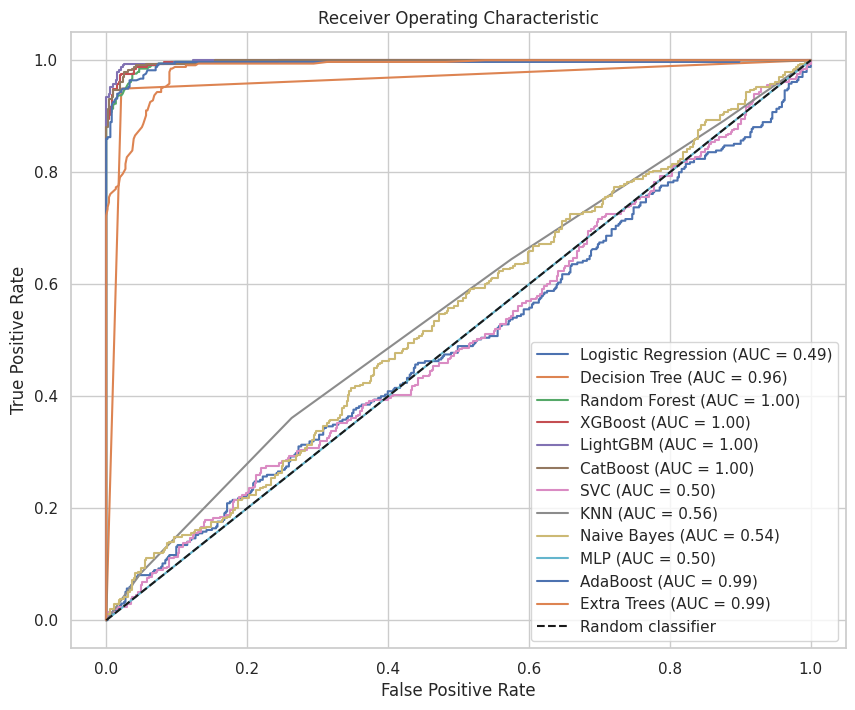

In [67]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

auc_scores = []

model_names = list(models.keys())

plt.figure(figsize=(10, 8))

for model_name in model_names:
    model = models[model_name]
    model.fit(X_train, y_train)
    
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test)[:, 1]
        
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        auc_score = auc(fpr, tpr)
        auc_scores.append(auc_score)
        
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (model_name, auc_score))

plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

plt.show()

## Summary of Data Modelling and Evaluation 

After splitting the dataset into training and testing sets and evaluating the performance of various models using several metrics, including ROC AUC score, Matthews correlation coefficient (MCC), precision score, accuracy, and F1 score. The analysis revealed that boosting models, particularly LightGBM (LGBM) and XGBoost (XGB), as well as tree-based models like Random Forest (RF) and Decision Tree (DT), significantly outperformed the other models.

Consequently, we have selected these high-performing models for further refinement. We will fine-tune their hyperparameters and stack them to enhance overall predictive performance.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Best Models</p>

After training and evaluating ten different models, we found that LightGBM (LGBM), XGBoost (XGB), Random Forest (RF), and Decision Tree (DT) exhibited superior performance compared to the other models. As a result, these models were selected for further refinement.

To enhance their predictive capabilities, employed Optuna for hyperparameter tuning of the selected models. With the optimal hyperparameters identified, the models are now prepared for the stacking phase, where combintion of their strengths will improve the overall performance.

In [68]:
import optuna
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score

## Hyperparameter Tuning

In [69]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
def objective_lightgbm(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'num_leaves': 2 ** trial.suggest_int('max_depth', 3, 12),  
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }
    model = LGBMClassifier(**params)  
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_xgboost(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }
    model = XGBClassifier(**params)  
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_randomforest(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    }
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_decisiontree(trial):
    params = {
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy'])
    }
    model = DecisionTreeClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

In [70]:
def objective_logistic_regression(trial):
    params = {
        'C': trial.suggest_loguniform('C', 1e-4, 1e2),  # Regularization strength
        'penalty': trial.suggest_categorical('penalty', ['l1', 'l2']),
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga'])  
    }
    
    model = LogisticRegression(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

study_lr = optuna.create_study(direction='maximize')
study_lr.optimize(objective_logistic_regression, n_trials=30)

best_params_lr = study_lr.best_params
best_logistic_regression = LogisticRegression(**best_params_lr)

[I 2024-10-26 16:25:51,522] A new study created in memory with name: no-name-f52a40b6-122b-4da5-863c-561ca23d6a18
[I 2024-10-26 16:25:51,555] Trial 0 finished with value: 0.6049528301886793 and parameters: {'C': 0.37450685489009233, 'penalty': 'l2', 'solver': 'saga'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-10-26 16:25:51,608] Trial 1 finished with value: 0.6049528301886793 and parameters: {'C': 11.774947625547085, 'penalty': 'l2', 'solver': 'saga'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-10-26 16:25:51,643] Trial 2 finished with value: 0.9044811320754716 and parameters: {'C': 0.041545981104528264, 'penalty': 'l1', 'solver': 'liblinear'}. Best is trial 2 with value: 0.9044811320754716.
[I 2024-10-26 16:25:51,707] Trial 3 finished with value: 0.6049528301886793 and parameters: {'C': 1.859016924298057, 'penalty': 'l1', 'solver': 'saga'}. Best is trial 2 with value: 0.9044811320754716.
[I 2024-10-26 16:25:51,755] Trial 4 finished with value: 0.604952830188

In [71]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lightgbm, n_trials=10)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgboost, n_trials=10)

study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_randomforest, n_trials=10)

study_dt = optuna.create_study(direction='maximize')
study_dt.optimize(objective_decisiontree, n_trials=10)

best_lgbm = LGBMClassifier(**study_lgbm.best_params)
best_xgb = XGBClassifier(**study_xgb.best_params)
best_rf = RandomForestClassifier(**study_rf.best_params)
best_dt = DecisionTreeClassifier(**study_dt.best_params)

[I 2024-10-26 16:25:54,696] A new study created in memory with name: no-name-ba0e63fa-a05a-4d51-a875-f11a03d6abb2


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-10-26 16:25:54,949] Trial 0 finished with value: 0.9764150943396226 and parameters: {'n_estimators': 440, 'max_depth': 4, 'learning_rate': 0.0609736815098913, 'subsample': 0.7402398498397249, 'colsample_bytree': 0.9155774908193051}. Best is trial 0 with value: 0.9764150943396226.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-10-26 16:25:55,680] Trial 1 finished with value: 0.9811320754716981 and parameters: {'n_estimators': 374, 'max_depth': 12, 'learning_rate': 0.09819246676807006, 'subsample': 0.9878240157607223, 'colsample_bytree': 0.9275347552579344}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-26 16:25:56,074] Trial 2 finished with value: 0.9752358490566038 and parameters: {'n_estimators': 471, 'max_depth': 6, 'learning_rate': 0.0971781971276694, 'subsample': 0.7574133379042125, 'colsample_bytree': 0.8568382222477743}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-26 16:25:56,680] Trial 3 finished with value: 0.9764150943396226 and parameters: {'n_estimators': 715, 'max_depth': 9, 'learning_rate': 0.08925826984131488, 'subsample': 0.9331798023160631, 'colsample_bytree': 0.5369371986521813}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-26 16:25:57,188] Trial 4 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 391, 'max_depth': 8, 'learning_rate': 0.0499682874192185, 'subsample': 0.8687224189566548, 'colsample_bytree': 0.5308701482170648}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-10-26 16:25:57,485] Trial 5 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 287, 'max_depth': 7, 'learning_rate': 0.08881063850177906, 'subsample': 0.8689452765505621, 'colsample_bytree': 0.6959164147870398}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-26 16:25:58,489] Trial 6 finished with value: 0.9775943396226415 and parameters: {'n_estimators': 869, 'max_depth': 12, 'learning_rate': 0.09698152426241605, 'subsample': 0.5789512959958911, 'colsample_bytree': 0.6115384446340092}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-10-26 16:25:59,255] Trial 7 finished with value: 0.9752358490566038 and parameters: {'n_estimators': 806, 'max_depth': 6, 'learning_rate': 0.02071302332946101, 'subsample': 0.8321671462664618, 'colsample_bytree': 0.5523329895058182}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-10-26 16:26:00,237] Trial 8 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 501, 'max_depth': 10, 'learning_rate': 0.02899788146519941, 'subsample': 0.6273688914381315, 'colsample_bytree': 0.7105677412902012}. Best is trial 1 with value: 0.9811320754716981.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-10-26 16:26:01,380] Trial 9 finished with value: 0.9811320754716981 and parameters: {'n_estimators': 937, 'max_depth': 9, 'learning_rate': 0.04858411976444521, 'subsample': 0.7640201828592468, 'colsample_bytree': 0.5469349199636004}. Best is trial 1 with value: 0.9811320754716981.
[I 2024-10-26 16:26:01,381] A new study created in memory with name: no-name-b3d0ab1c-74c3-4490-8058-3fbaadad895b
[I 2024-10-26 16:26:02,184] Trial 0 finished with value: 0.972877358490566 and parameters: {'n_estimators': 801, 'max_depth': 12, 'learning_rate': 0.08209994179300442, 'subsample': 0.8257682722999999, 'colsample_bytree': 0.5042049854122256}. Best is trial 0 with value: 0.972877358490566.
[I 2024-10-26 16:26:02,413] Trial 1 finished with value: 0.9705188679245284 and parameters: {'n_estimators': 242, 'max_depth': 5, 'learning_rate': 0.09010452044776533, 'subsample': 0.7023124442800038, 'colsample_bytree': 0.7396529505845135}. Best is trial 0 with value: 0.972877358490566.
[I 2024-10-26 16:2

## Feature Importance (Different Models)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000888 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

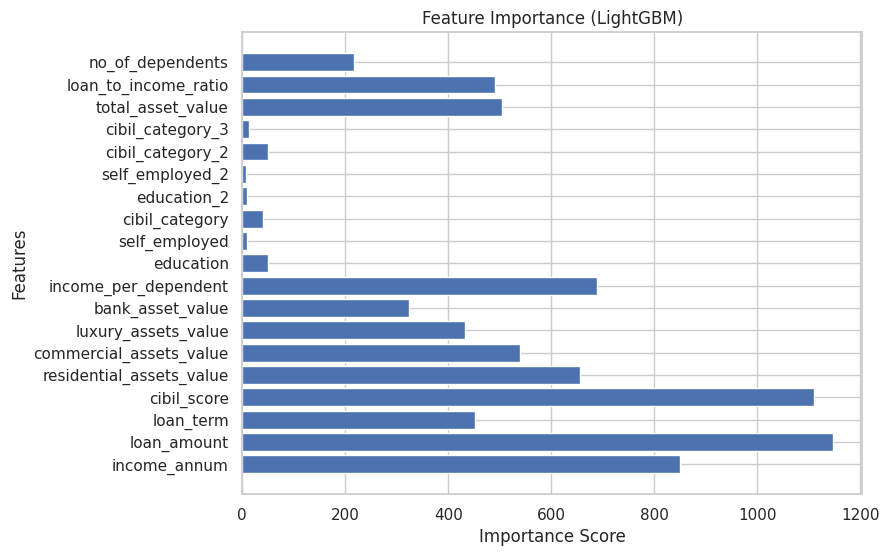

In [72]:
best_lgbm.fit(X_train, y_train)

# Access and plot feature importances
importances = best_lgbm.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (LightGBM)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

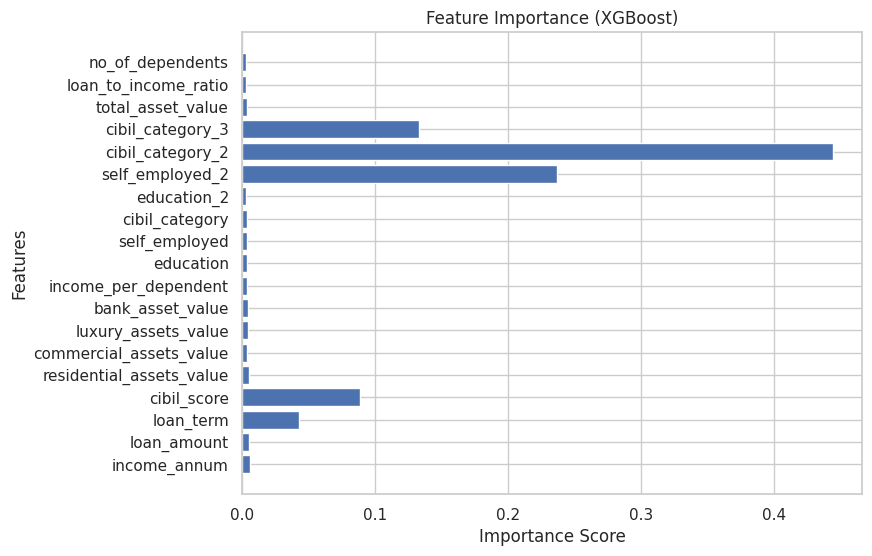

In [73]:
best_xgb.fit(X_train, y_train)

# Access and plot feature importances
importances = best_xgb.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (XGBoost)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

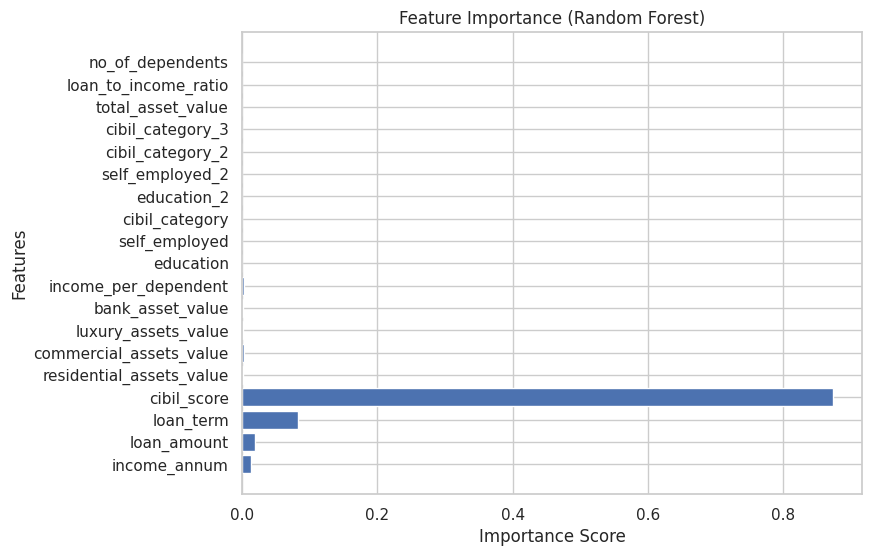

In [74]:
best_rf.fit(X_train, y_train)

# Access and plot feature importances
importances = best_rf.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (Random Forest)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

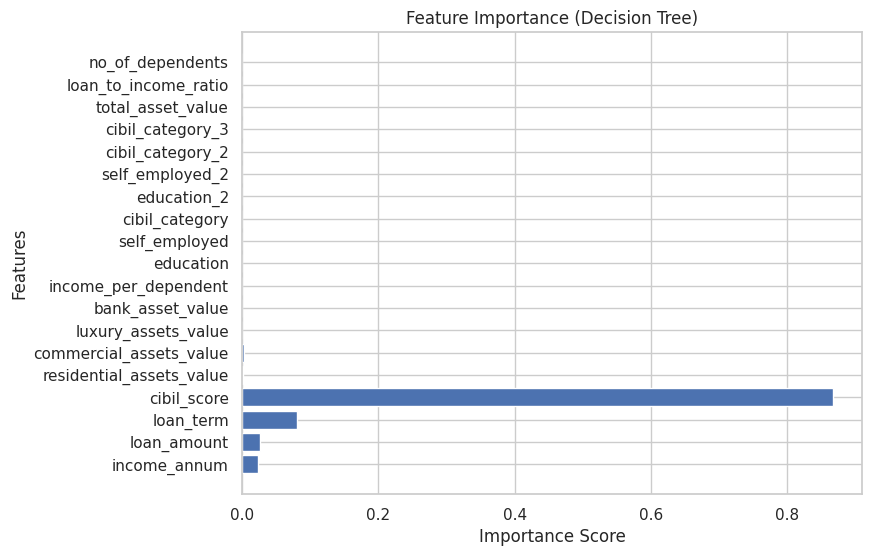

In [75]:
best_dt.fit(X_train, y_train)

# Access and plot feature importances
importances = best_dt.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (Decision Tree)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

### Feature Importance Analysis

Upon analyzing feature importance, identified several key features that significantly influence the approval or rejection of a loan. Notably, CIBIL Score, Loan Term, Loan Amount, and Annual Income emerged as critical factors in the decision-making process. These features play a vital role in assessing an applicant's creditworthiness and ultimately impact the loan approval outcomes.

## Stacking the Best Models

In [76]:
stacked_model = StackingClassifier(
    estimators=[
        ('lgbm', best_lgbm),
        ('xgb', best_xgb),
        ('rf', best_rf),
        ('dt', best_dt)
    ],
    final_estimator=LogisticRegression(C= 97.51917375127391, penalty= 'l1', solver= 'liblinear')
)

stacked_model.fit(X_train, y_train)

y_pred = stacked_model.predict(X_test)

y_prob = stacked_model.predict_proba(X_test)[:, 1] if hasattr(stacked_model, "predict_proba") else None

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
mcc = matthews_corrcoef(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob) if y_prob is not None else 'N/A' 

print(f"Test Accuracy: {accuracy}")
print(f"Test Precision: {precision}")
print(f"Test Recall: {recall}")
print(f"Test F1 Score: {f1}")
print(f"Test MCC: {mcc}")
print(f"Test ROC-AUC: {roc_auc}")

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

## Evaluating the stacked model

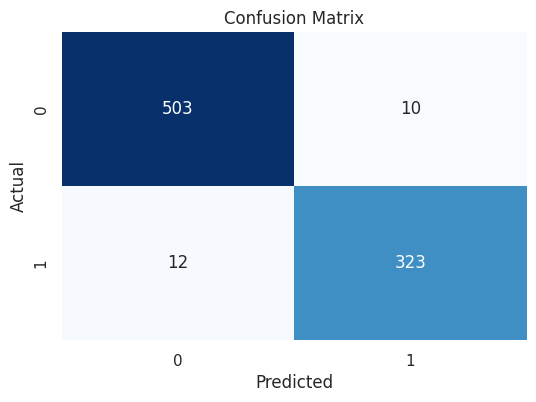

In [77]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

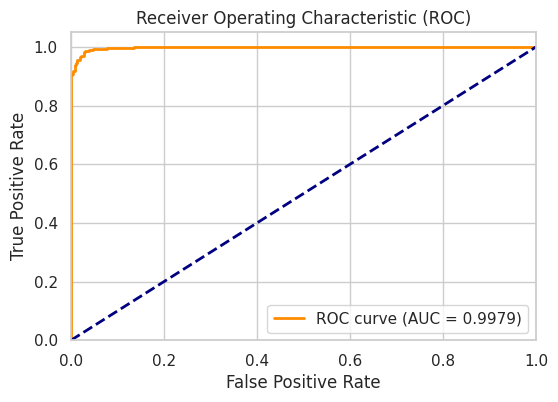

In [78]:
from sklearn.metrics import roc_curve, auc

if y_prob is not None:
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

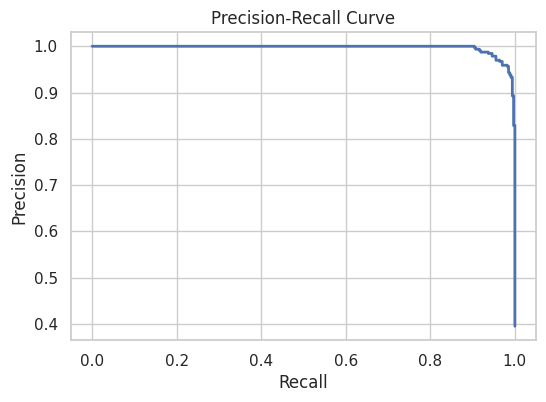

In [79]:
from sklearn.metrics import precision_recall_curve

if y_prob is not None:
    precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_prob)

    # Plot Precision-Recall curve
    plt.figure(figsize=(6, 4))
    plt.plot(recall_vals, precision_vals, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

The stacked model demonstrates consistently superior performance across all metrics, making it an ideal choice for our primary prediction model. By integrating this stacked model in the deployment phase, we can ensure more accurate and reliable predictions, leveraging the combined strengths of multiple algorithms.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Model Explanability</p>

## Explainability with LIME (Local Interpretable Model-agnostic Explanations)

Using LIME to provide explanations for individual predictions from the stacked model. LIME helps explain why a particular loan was approved or rejected.
Selected a few examples (approved and rejected) and generate LIME explanations to show the impact of each feature.


In [80]:
import numpy as np
import pandas as pd
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

In [81]:
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Rejected', 'Approved'], 
    mode='classification'
)

In [82]:
approved_indices = np.where(y_test == 1)[0] 
rejected_indices = np.where(y_test == 0)[0]  

sample_indices = np.concatenate((approved_indices[:3], rejected_indices[:3]))

In [83]:
for index in sample_indices:
    instance = X_test.iloc[index].values.reshape(1, -1)
    prediction = stacked_model.predict(instance)
    
    exp = explainer.explain_instance(
        data_row=instance[0],
        predict_fn=stacked_model.predict_proba
    )
    
    exp.show_in_notebook(show_table=True, show_all=False) 
    exp.save_to_file(f'lime_explanation_{index}.html') 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


Using LIME, we can gain clear insights into why our model made specific predictions. This step is crucial, as it enhances transparency and interpretability by showing which features most influenced each prediction, making it easier to trust and understand the model’s decisions.

# Model Deployemnt

For model deployment, the process begins by extracting the trained models and preparing them for integration into our Flask server, where they will serve predictions. To ensure compatibility and avoid dependency issues, the specific versions of libraries used during model training are also extracted and installed. This version-matching step guarantees that the models run seamlessly within the server environment, enabling consistent, reliable predictions through the Flask application.

In [84]:
import joblib

joblib.dump(stacked_model, 'stacked_model.pkl')

['stacked_model.pkl']

In [85]:
import sklearn
print(sklearn.__version__)

1.2.2


In [86]:
import xgboost
print(xgboost.__version__)

2.0.3


In [87]:
import joblib

joblib.dump(best_lgbm, 'best_lgbm.pkl')
joblib.dump(best_xgb, 'best_xgb.pkl')
joblib.dump(best_rf, 'best_rf.pkl')
joblib.dump(best_dt, 'best_dt.pkl')

['best_dt.pkl']

In [88]:
input_samples = X_train.sample(1)
input_samples

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents
2136,-0.151894,-0.169542,1.595019,1.37534,-0.277278,0.65054,-0.345436,-0.75603,0.129285,1.0,0.0,0.0,1.0,1.0,0.0,0.0,52200000.0,3.014085,2.0


In [89]:
import sklearn
print(sklearn.__version__)

1.2.2


## LINKS

- Github Repo: https://github.com/bses7/Loan-Approval-Model
- WEB APP: https://loan-approval-model.onrender.com/

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Conclusion</p>

The project successfully demonstrates the transformative potential of machine learning in enhancing the loan approval process. By predicting loan application outcomes with high accuracy, the model addresses key challenges in traditional loan processing, including reducing subjectivity, improving efficiency, and minimizing human error. Leveraging advanced machine learning models like XGBoost, LightGBM, and Random Forest, coupled with comprehensive data preprocessing and feature engineering, the project achieved a robust predictive capability, offering a valuable decision-support tool for lending institutions.

# <p style="background-color: #d4edda; font-family: Algerian; font-size: 200%; text-align: center; color: black; border-radius: 1000px 50px;">Future Work</p>

While this project demonstrates promising results, there are several areas for further enhancement:

- Model Optimization: Additional hyperparameter tuning and experimentation with advanced ensemble methods could further improve model accuracy and robustness.
- Explainability: Integrating explainable AI tools like LIME or SHAP into the user interface would enable deeper insights into why certain applications are approved or rejected, which could help build trust in automated decisions.
- Data Updates: Periodic retraining with new data would help maintain the model's accuracy over time as lending trends and financial patterns evolve.
- Deployment Scalability: Future deployments could explore cloud-based solutions like AWS or GCP for improved scalability and performance in handling larger volumes of real-time requests.
- Security & Compliance: Enhancing data security measures and ensuring compliance with financial regulations would be critical in a production environment.
- Expanding in these areas will not only improve the model’s utility and reliability but also pave the way for more sophisticated, scalable loan prediction systems in the future.